In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from util_functions import *

In [3]:
import os
from pathlib import Path

import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=500)
plt.rcParams['figure.figsize'] = (5, 5)

In [4]:
condition_key = 'sample'
cell_type_key = ['ann_finest_level']

HLCA_DATA_PATH = os.path.expanduser('~/io/scpoli_repr/hlca_counts_commonvars.h5ad')
HLCA_EXTENDED_DATA_PATH = os.path.expanduser('~/io/scpoli_repr/hlca_extended_commonvars.h5ad')
HLCA_CANCER_DATA_PATH = os.path.expanduser('~/io/scpoli_repr/hlca_cancer_commonvars.h5ad')

MAPPED_DATA_format = os.path.expanduser("~/io/scpoli_repr/mappings/hlca_{exp}_sample_{replicate}{ext}")

In [5]:
KNOWN_MAPPED_DATA = {
    'healthy': {
        'scArches': (os.path.expanduser('~/io/scpoli_repr/scarches_models/HLCA_mapped_model_sample_healthy-knn.latent.h5ad'), 0.3),
        'scPoli': (os.path.expanduser('~/io/scpoli_repr/lataq_models/HLCA_mapped_model_sample_healthy.latent.h5ad'), 0.3),
        'scPoli - KNN': (os.path.expanduser('~/io/scpoli_repr/lataq_models/HLCA_mapped_model_sample_healthy-knn.latent.h5ad'), 0.3),
    },
    'cancer': {
        'scArches': (os.path.expanduser('~/io/scpoli_repr/scarches_models/HLCA_mapped_model_sample_cancer-knn.latent.h5ad'), 0.3),
        'scPoli': (os.path.expanduser('~/io/scpoli_repr/lataq_models/HLCA_mapped_model_sample_cancer.latent.h5ad'), 0.857),
        'scPoli - KNN': (os.path.expanduser('~/io/scpoli_repr/lataq_models/HLCA_mapped_model_sample_cancer-knn.latent.h5ad'), 0.3),
    }
}

In [6]:
THRESHOLD_CURVE_RESULT_SAVE_ADDRESS_format = os.path.expanduser('~/io/scpoli_repr/HLCA_threshold_curve_{}.csv')

In [7]:
adata_extended = sc.read(HLCA_EXTENDED_DATA_PATH)
adata_extended = adata_extended[adata_extended.obs['study'] == 'Meyer_2021'].copy()
adata_extended.X = adata_extended.X.astype(np.float32)
adata_extended

AnnData object with n_obs × n_vars = 128628 × 1897
    obs: 'dataset', 'study', 'original_celltype_ann', 'condition', 'subject_ID', 'sample', 'cells_or_nuclei', 'single_cell_platform', 'sample_type', 'age', 'sex', 'ethnicity', 'BMI', 'smoking_status', 'anatomical_region_level_1', 'anatomical_region_coarse', 'anatomical_region_detailed', 'genome', 'disease'

In [8]:
adata_cancer = sc.read(HLCA_CANCER_DATA_PATH)
adata_cancer.X = adata_cancer.X.astype(np.float32)
adata_cancer

AnnData object with n_obs × n_vars = 93575 × 1897
    obs: 'n_genes_detected', 'total_counts', 'cell_from_tumor', 'subject_ID', 'tumor_site', 'original_celltype_ann', 'sample', 'study', 'study_long', 'dataset', 'last_author_PI', 'lung_vs_nasal', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'ann_highest_res', 'ann_new', 'scanvi_label'
    var: 'original_gene_names', 'gene_symbols', 'ensembl'

# Comparison with other models

## Evaluation on Healthy Dataset

In [9]:
mapping_df = get_celltype_mappings('Meyer_2021')
adata_extended.obs['given_ann_finest_level'] = adata_extended.obs['original_celltype_ann'].map(dict(mapping_df.values))
adata_extended.obs['acceptable_prediction'] = adata_extended.obs['given_ann_finest_level'].map(dict(manual_to_fine_grained))

In [10]:
healthy_result_df = None

for method_name, (latent_output_path, uncert_threshold) in KNOWN_MAPPED_DATA['healthy'].items():
    print(method_name)
    adata_latent = sc.read(latent_output_path)
    adata_latent.obs['given_ann_finest_level'] = adata_extended.obs['given_ann_finest_level']
    adata_latent.obs['acceptable_prediction'] = adata_extended.obs['acceptable_prediction']

    adata_latent.obs['result'] = get_prediction_performance(adata_latent.obs, 'pred_ann_class', 'pred_ann_uncert', 'acceptable_prediction', uncert_threshold)
    # plot_hlca_healthy_results(adata_latent.obs, 'given_ann_finest_level', 'result')
    
    result_df = get_uncert_threshold_data(adata_latent.obs, 'pred_ann_class', 'pred_ann_uncert', 
                                          'acceptable_prediction', method_name=method_name, MAX_THRESHOLD=10)
    if healthy_result_df is None:
        healthy_result_df = result_df
    else:
        healthy_result_df = pd.concat([healthy_result_df, result_df]).reset_index(drop=True)

scArches
scPoli
scPoli - KNN


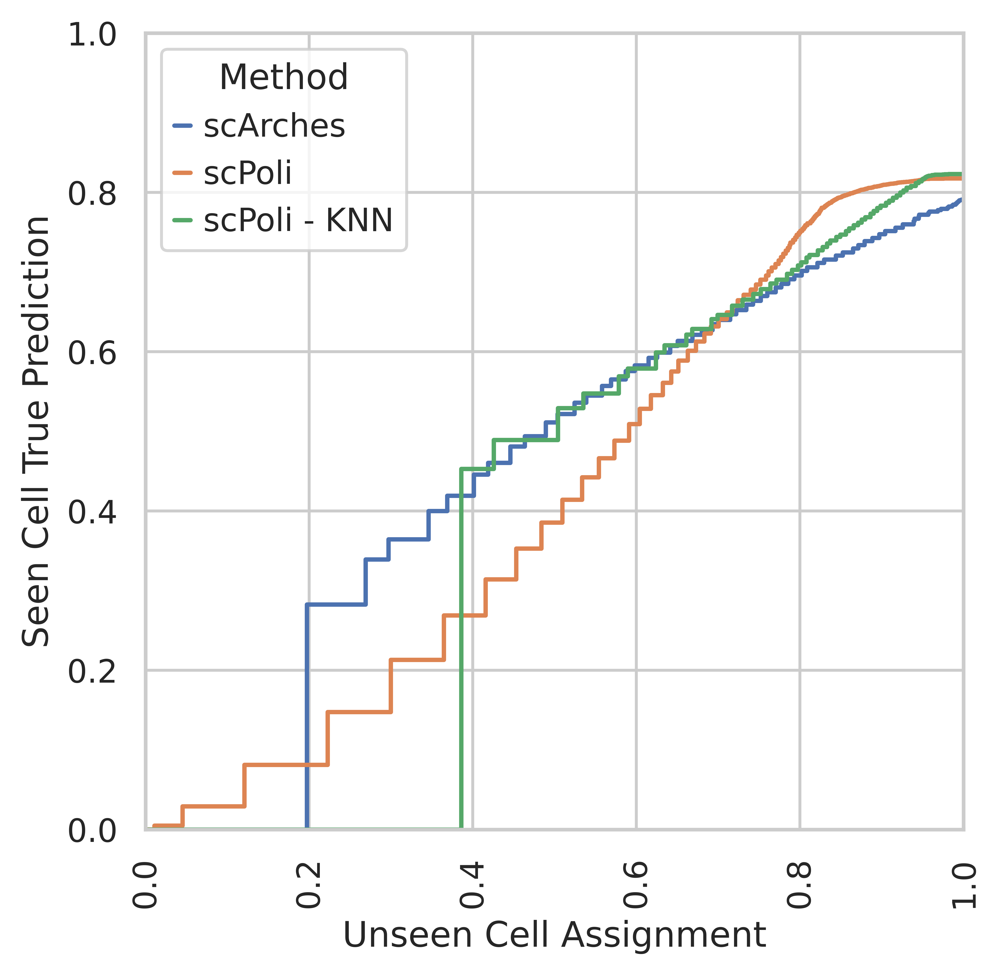

In [11]:
plot_uncert_threshold(healthy_result_df)

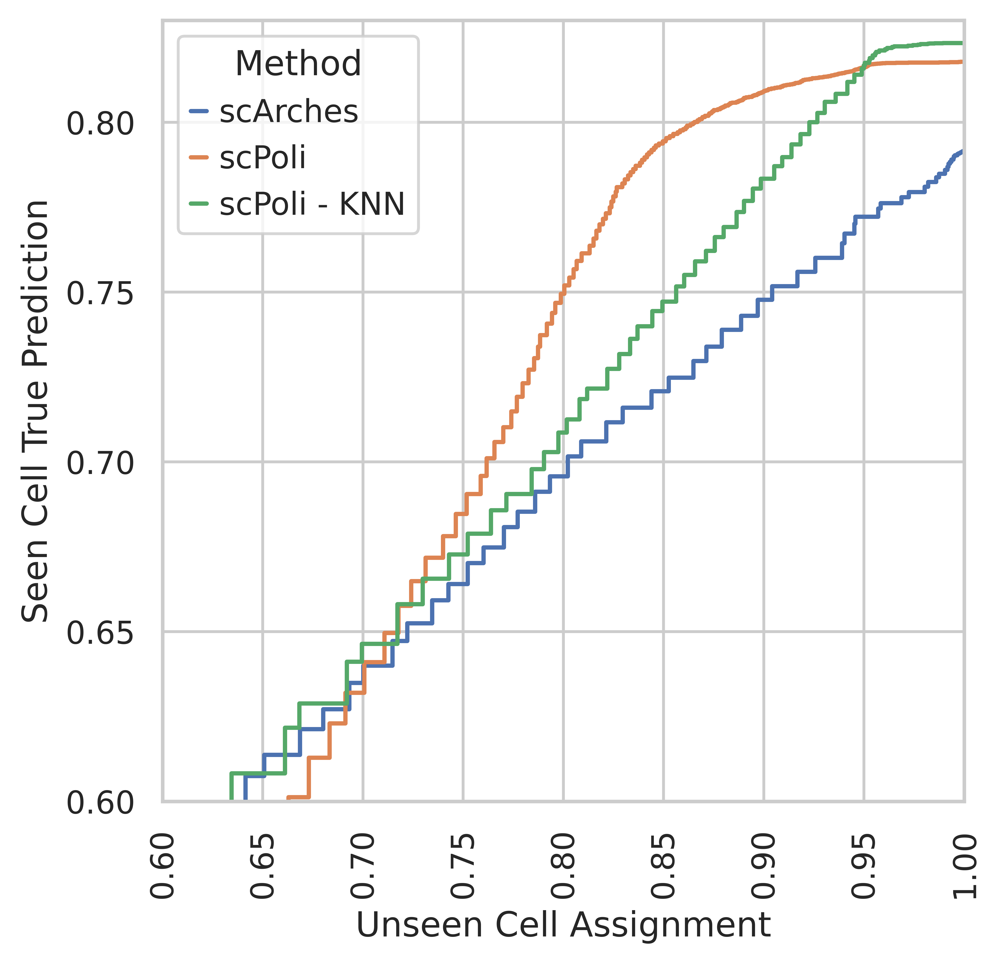

In [12]:
plot_uncert_threshold(healthy_result_df, (0.6, 1.), (0.6, 0.83))

## Evaluation on Cancer Dataset

In [13]:
mapping_df = get_celltype_mappings('Thienpont_2018')
adata_cancer.obs['given_ann_finest_level'] = adata_cancer.obs['original_celltype_ann'].map(dict(mapping_df.values))
adata_cancer.obs['acceptable_prediction'] = adata_cancer.obs['given_ann_finest_level'].astype(str).map(dict(thienpont_2018_acceptable_preds))

scArches


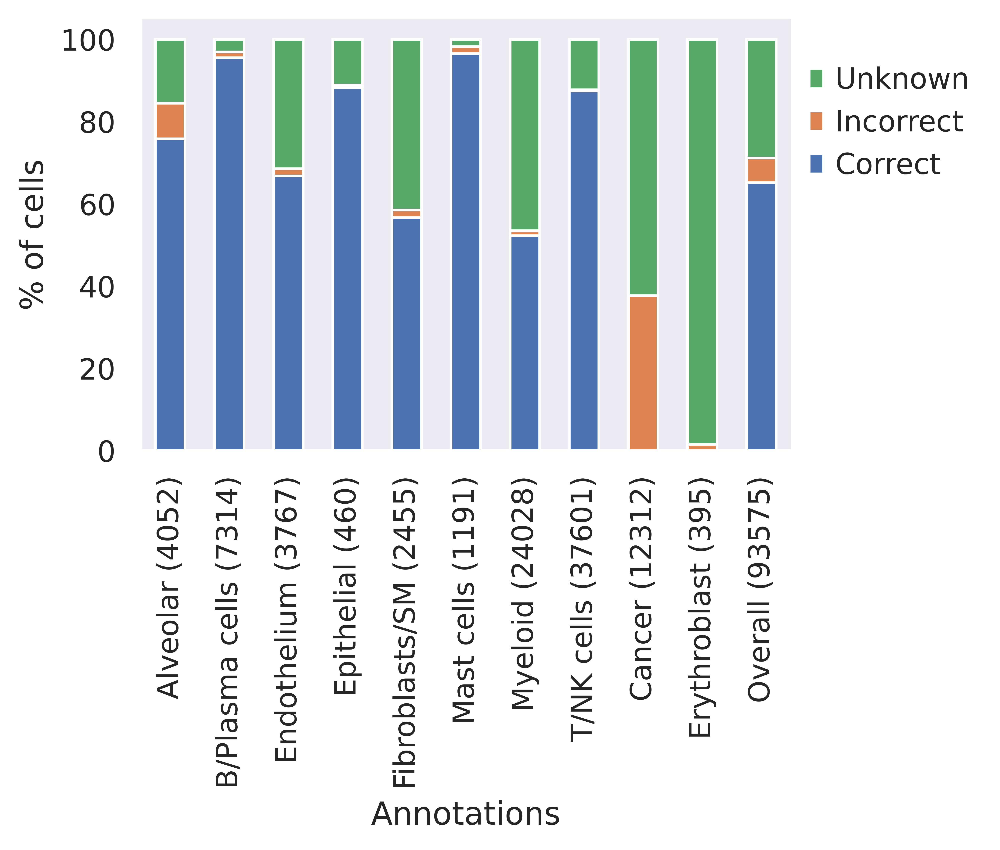

scPoli


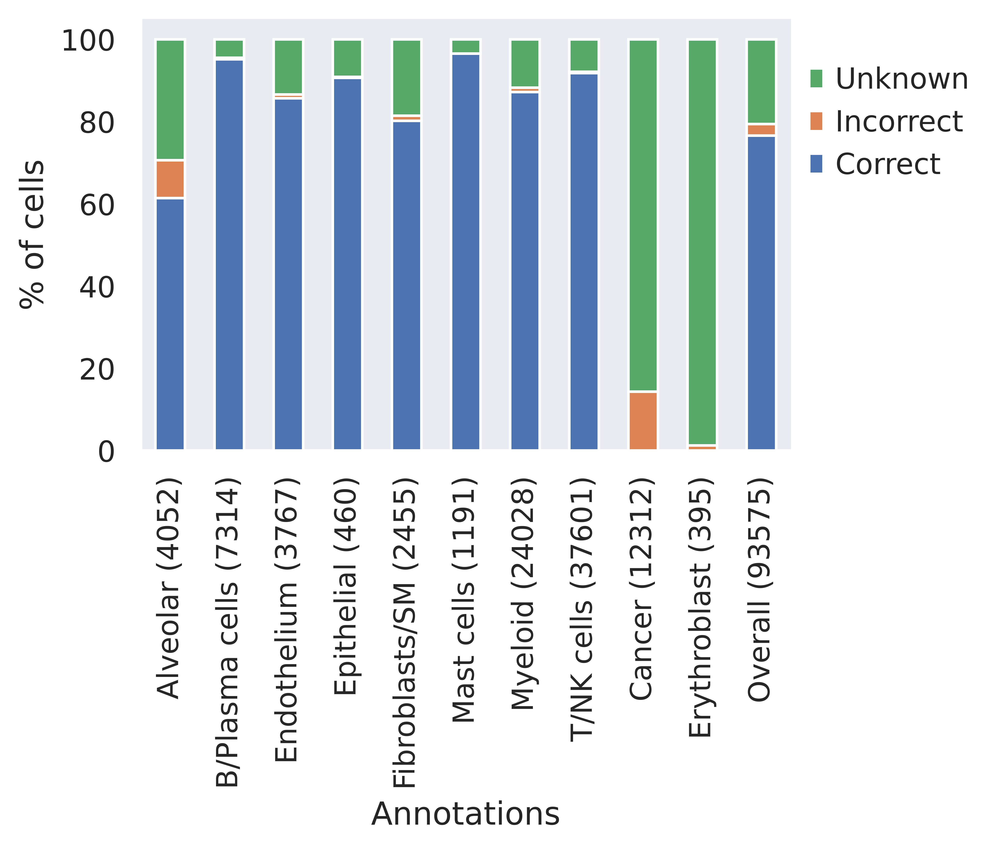

scPoli - KNN


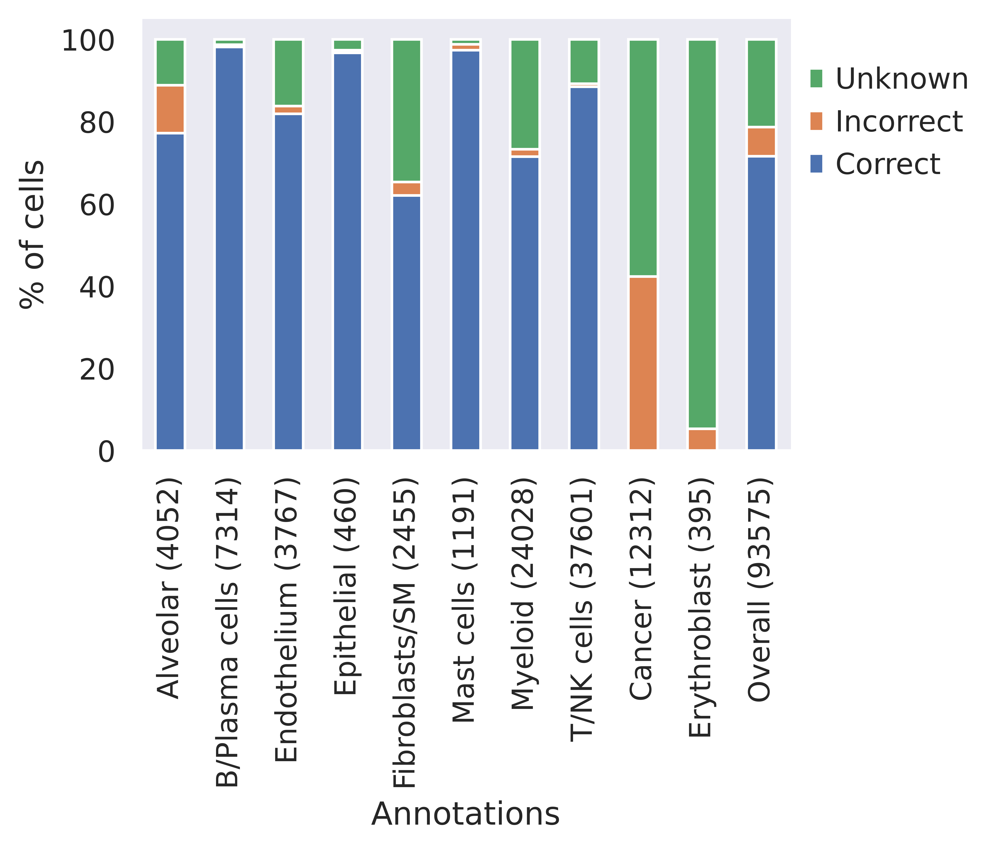

In [14]:
cancer_result_df = None

for method_name, (latent_output_path, uncert_threshold) in KNOWN_MAPPED_DATA['cancer'].items():
    print(method_name)
    adata_latent = sc.read(latent_output_path)
    adata_latent.obs['given_ann_finest_level'] = adata_cancer.obs['given_ann_finest_level']
    adata_latent.obs['acceptable_prediction'] = adata_cancer.obs['acceptable_prediction']

    adata_latent.obs['result'] = get_prediction_performance(adata_latent.obs, 'pred_ann_class', 'pred_ann_uncert', 'acceptable_prediction', uncert_threshold)
    plot_hlca_cancer_results(adata_latent.obs, 'given_ann_finest_level', 'result')
    
    result_df = get_uncert_threshold_data(adata_latent.obs, 'pred_ann_class', 'pred_ann_uncert', 
                                          'acceptable_prediction', method_name=method_name, MAX_THRESHOLD=10)
    if cancer_result_df is None:
        cancer_result_df = result_df
    else:
        cancer_result_df = pd.concat([cancer_result_df, result_df]).reset_index(drop=True)

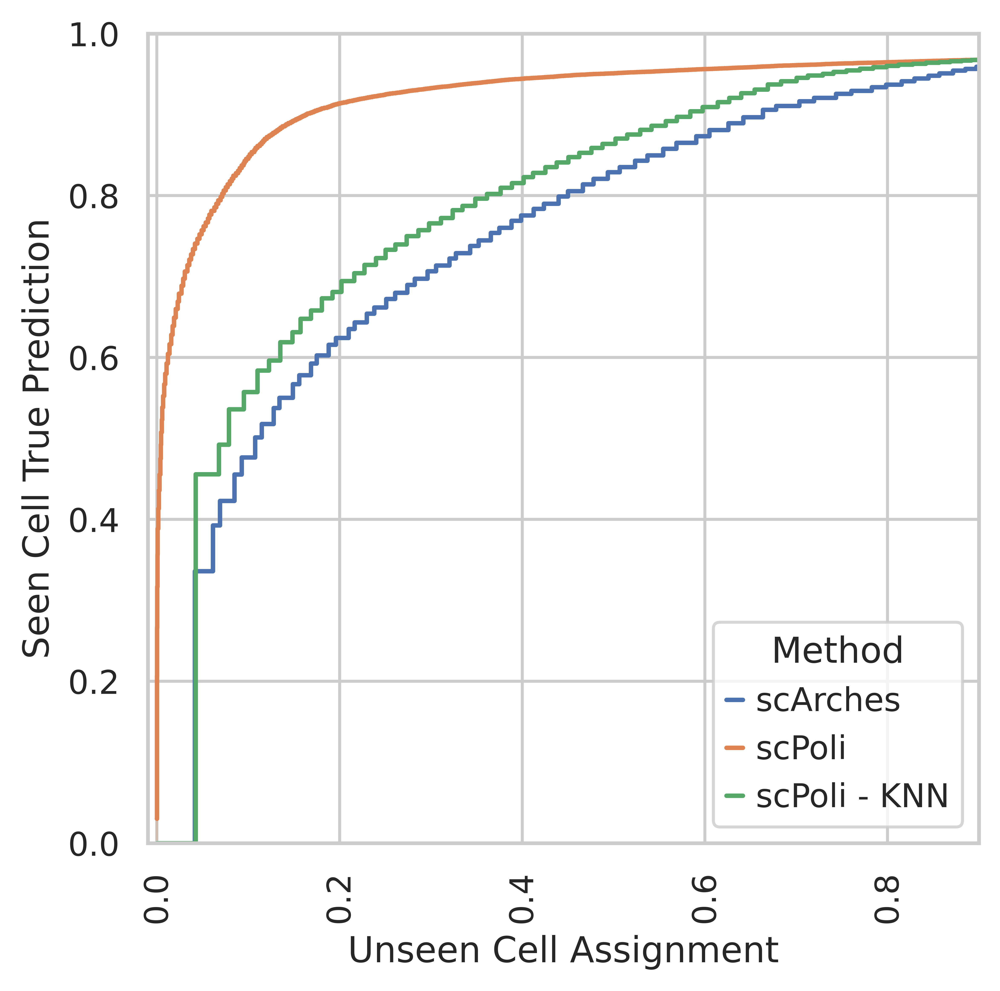

In [15]:
plot_uncert_threshold(cancer_result_df, (-0.01, 0.9), (0., 1.0))

# Stability test

## Evaluation on Healthy Dataset

In [16]:
mapping_df = get_celltype_mappings('Meyer_2021')
adata_extended.obs['given_ann_finest_level'] = adata_extended.obs['original_celltype_ann'].map(dict(mapping_df.values))
adata_extended.obs['acceptable_prediction'] = adata_extended.obs['given_ann_finest_level'].map(dict(manual_to_fine_grained))

In [17]:
UNCERTAINTY_THRESHOLD = 0.3

# healthy_result_df = None
for i in range(10):
    ds_name = 'healthy'
    method_name = f'scPoli_repl_{i}'
    print("Replicate ", i, "DS", ds_name)

    latent_output_path = MAPPED_DATA_format.format(exp=f"{ds_name}_mapped", replicate=i, ext=".latent.h5ad")
    
    if not os.path.exists(latent_output_path):
        print(f"Reference {latent_output_path} not found. Skipping.")
        continue

    adata_latent = sc.read(latent_output_path)
    adata_latent.obs['given_ann_finest_level'] = adata_extended.obs['given_ann_finest_level']
    adata_latent.obs['acceptable_prediction'] = adata_extended.obs['acceptable_prediction']
    adata_latent

    
    adata_latent.obs['result'] = get_prediction_performance(adata_latent.obs, 'pred_ann_class', 'pred_ann_uncert', 'acceptable_prediction', UNCERTAINTY_THRESHOLD)
    # plot_hlca_healthy_results(adata_latent.obs, 'given_ann_finest_level', 'result')
    
    result_df = get_uncert_threshold_data(adata_latent.obs, 
                                          'pred_ann_class', 'pred_ann_uncert', 'acceptable_prediction', method_name=method_name, MAX_THRESHOLD=10)
    
    if healthy_result_df is None:
        healthy_result_df = result_df
    else:
        healthy_result_df = pd.concat([healthy_result_df, result_df]).reset_index(drop=True)

Replicate  0 DS healthy
Replicate  1 DS healthy
Replicate  2 DS healthy
Replicate  3 DS healthy
Replicate  4 DS healthy
Replicate  5 DS healthy
Replicate  9 DS healthy


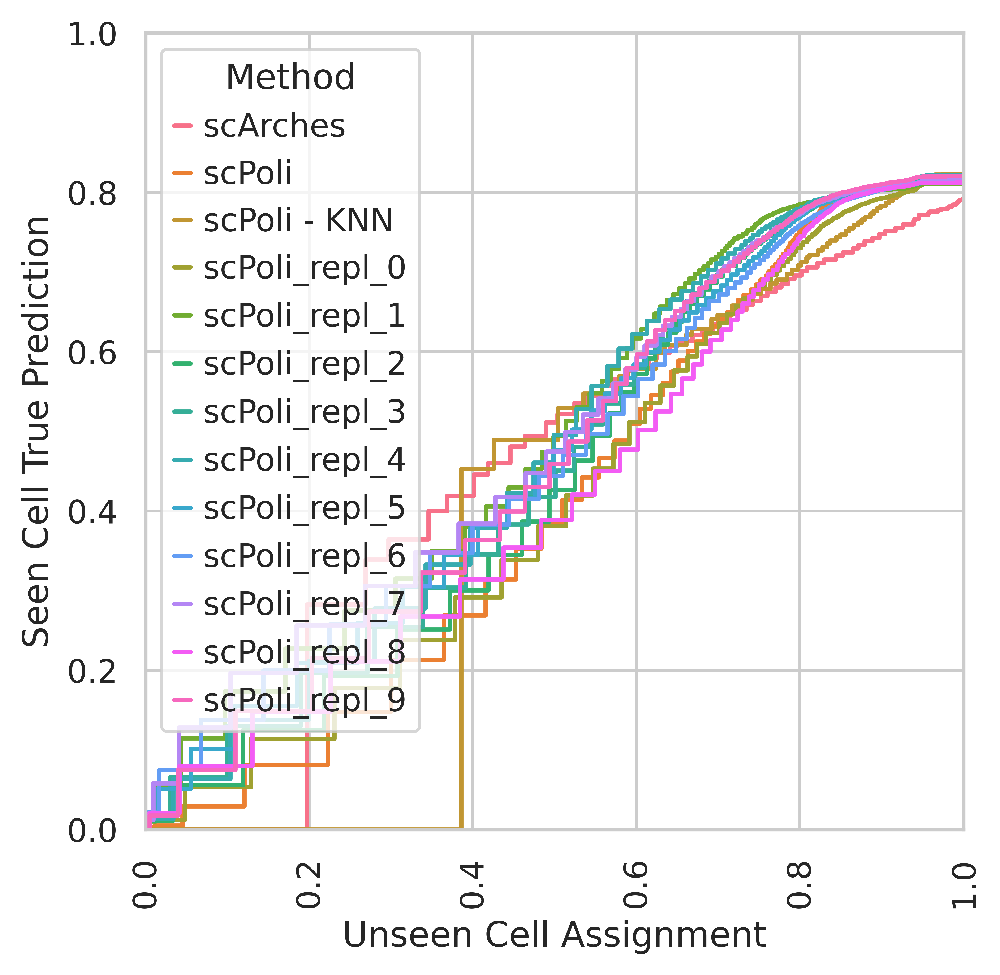

In [ ]:
plot_uncert_threshold(healthy_result_df)

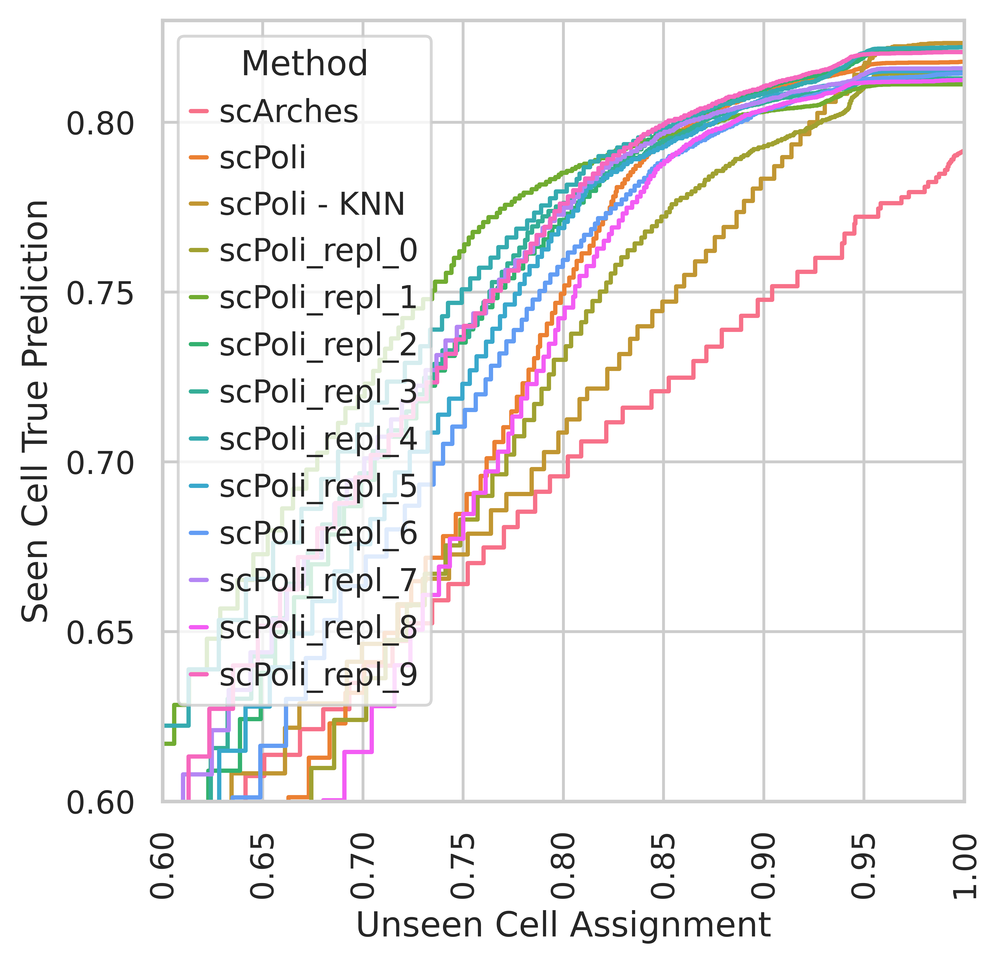

In [ ]:
plot_uncert_threshold(healthy_result_df, (0.6, 1.), (0.6, 0.83))

In [ ]:
healthy_result_df.to_csv(THRESHOLD_CURVE_RESULT_SAVE_ADDRESS_format.format('healthy'), index=False)

## Evaluation on Cancer Dataset

In [ ]:
mapping_df = get_celltype_mappings('Thienpont_2018')
adata_cancer.obs['given_ann_finest_level'] = adata_cancer.obs['original_celltype_ann'].map(dict(mapping_df.values))
adata_cancer.obs['acceptable_prediction'] = adata_cancer.obs['given_ann_finest_level'].astype(str).map(dict(thienpont_2018_acceptable_preds))

Replicate  0 DS cancer


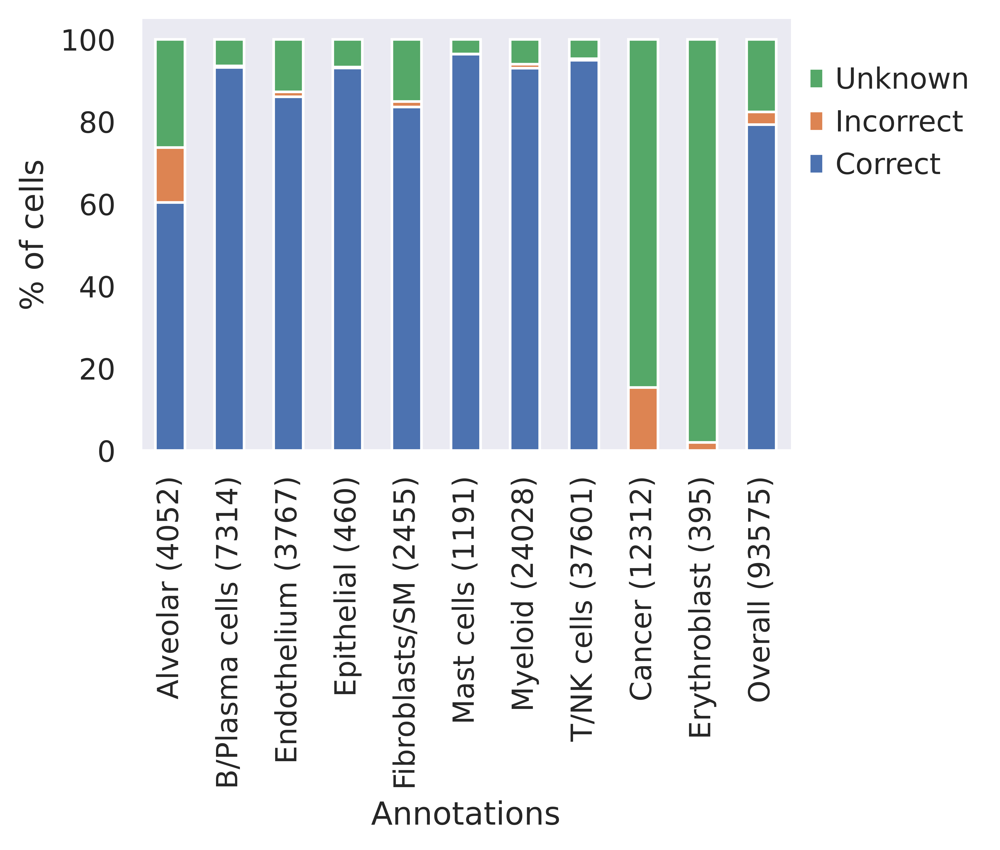

Replicate  1 DS cancer


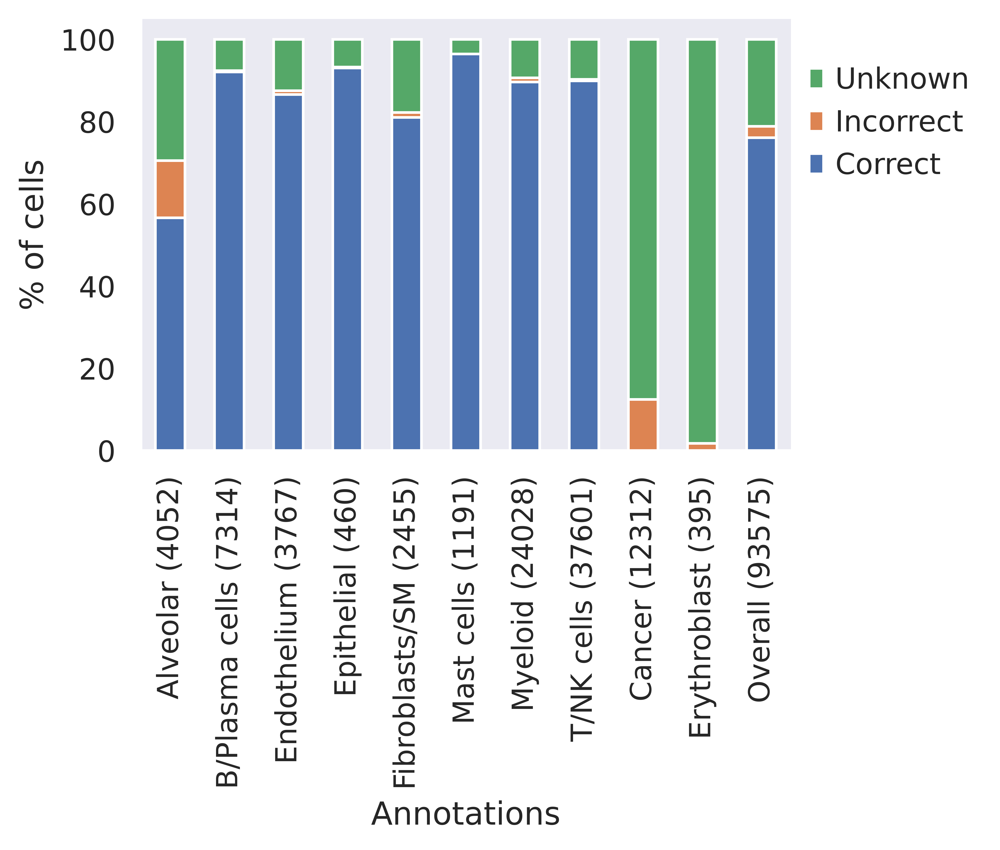

Replicate  2 DS cancer


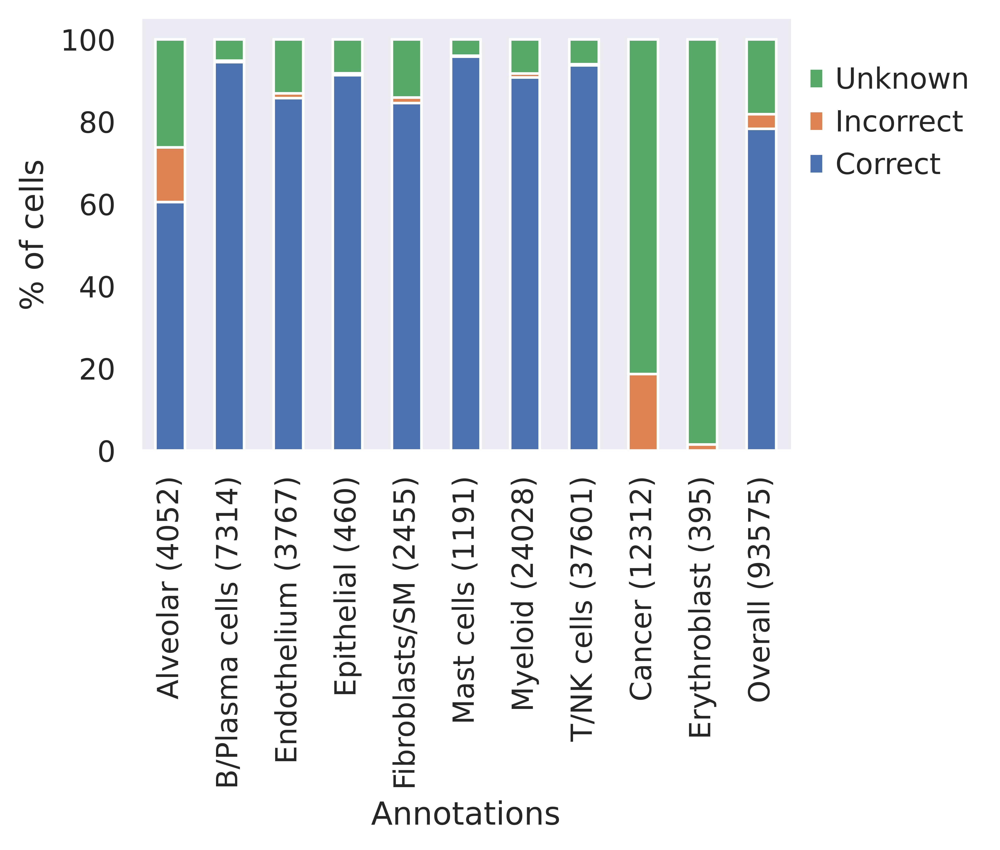

Replicate  3 DS cancer


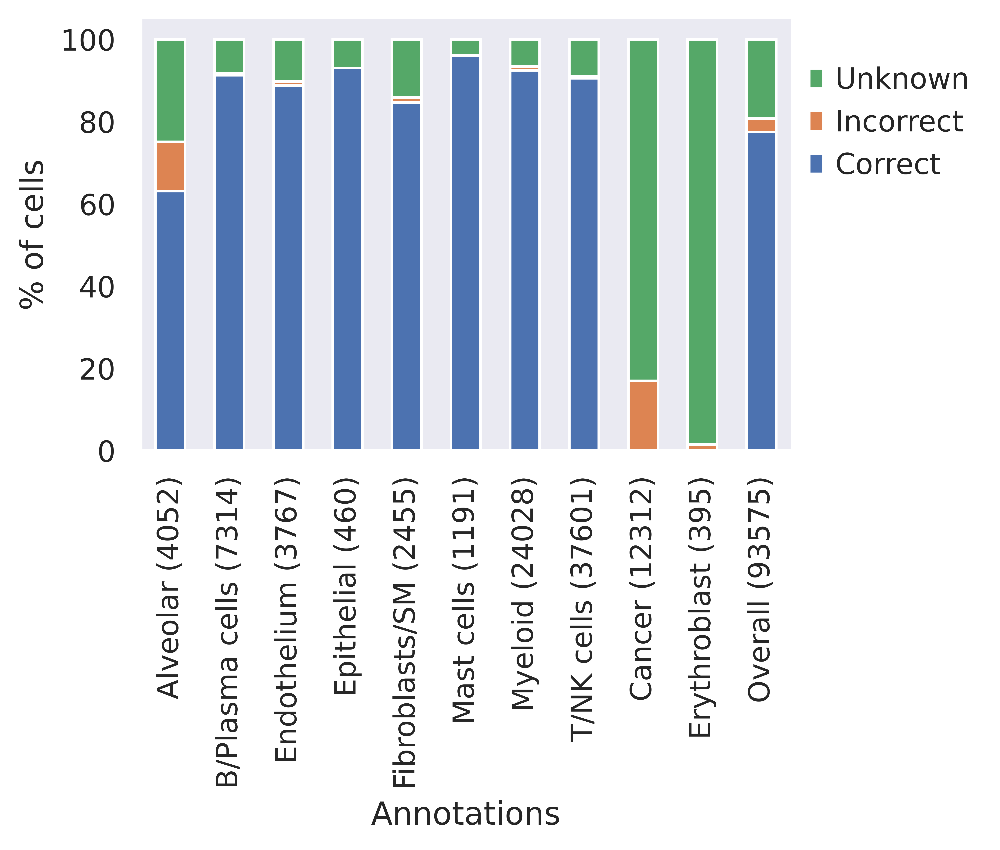

Replicate  4 DS cancer


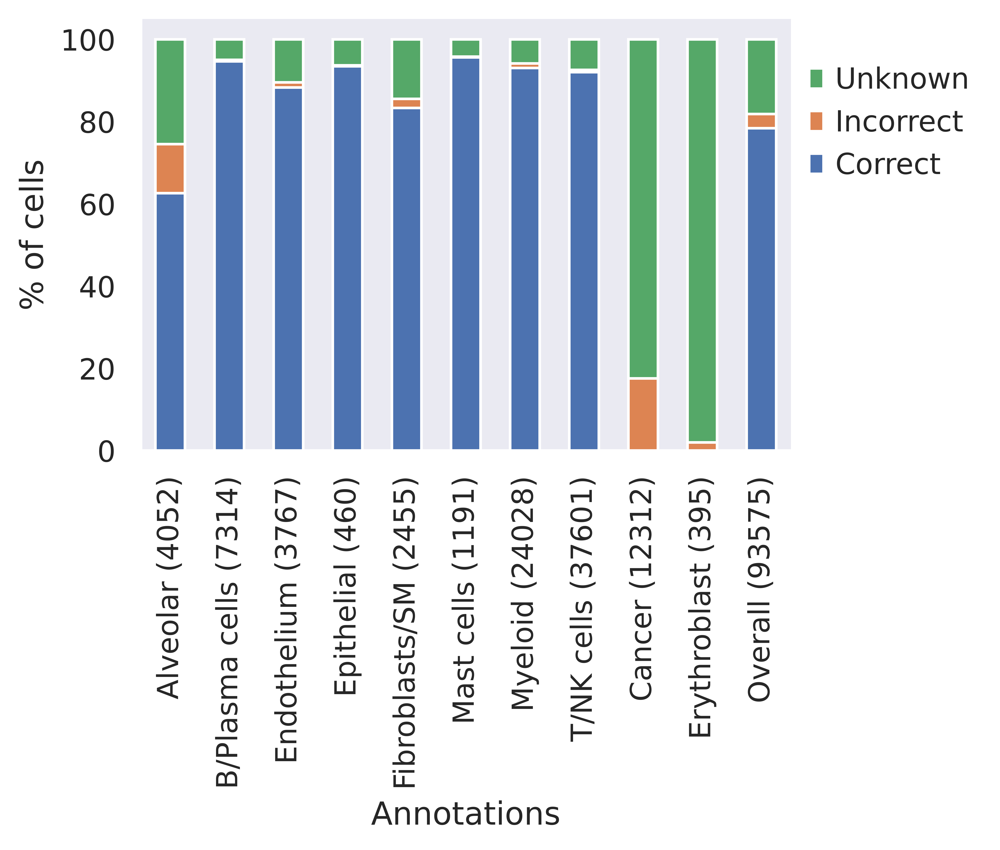

Replicate  5 DS cancer


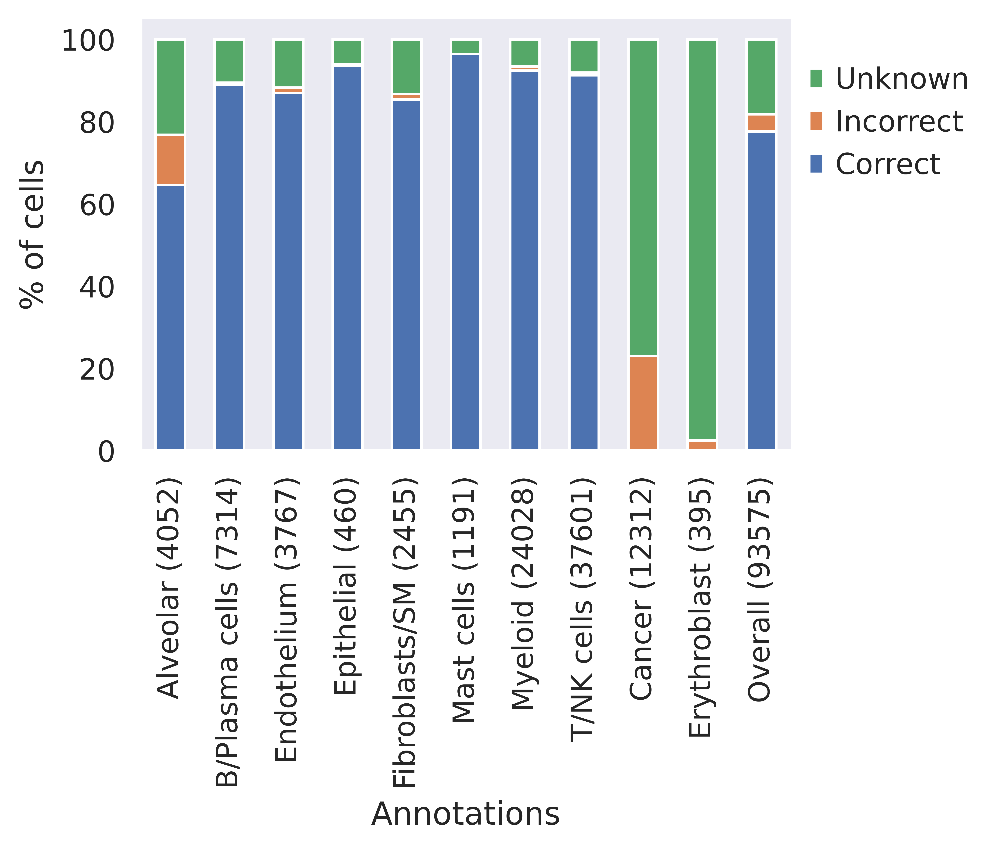

Replicate  6 DS cancer


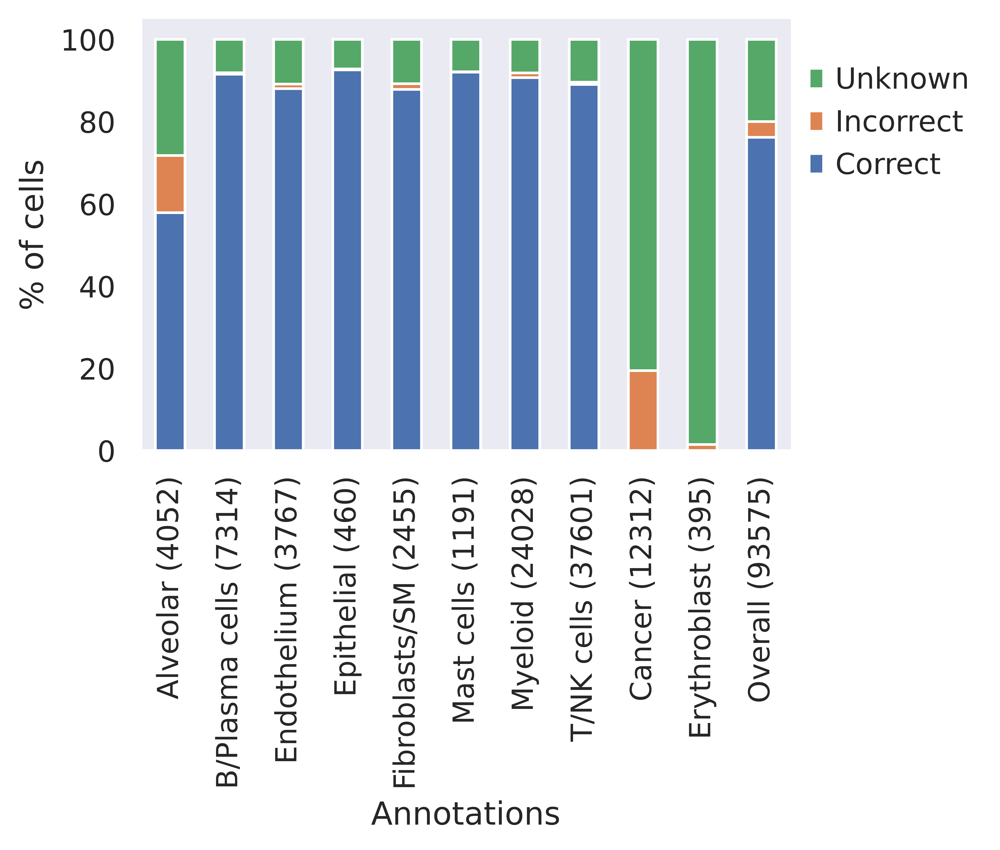

Replicate  7 DS cancer


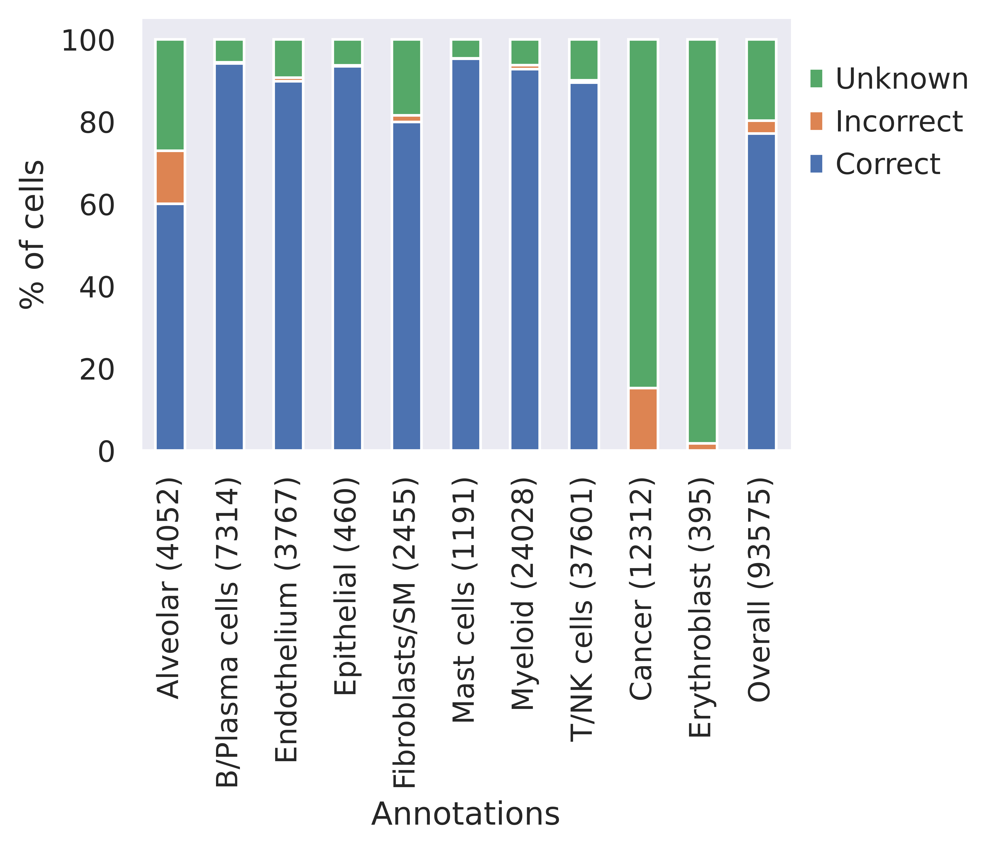

Replicate  8 DS cancer


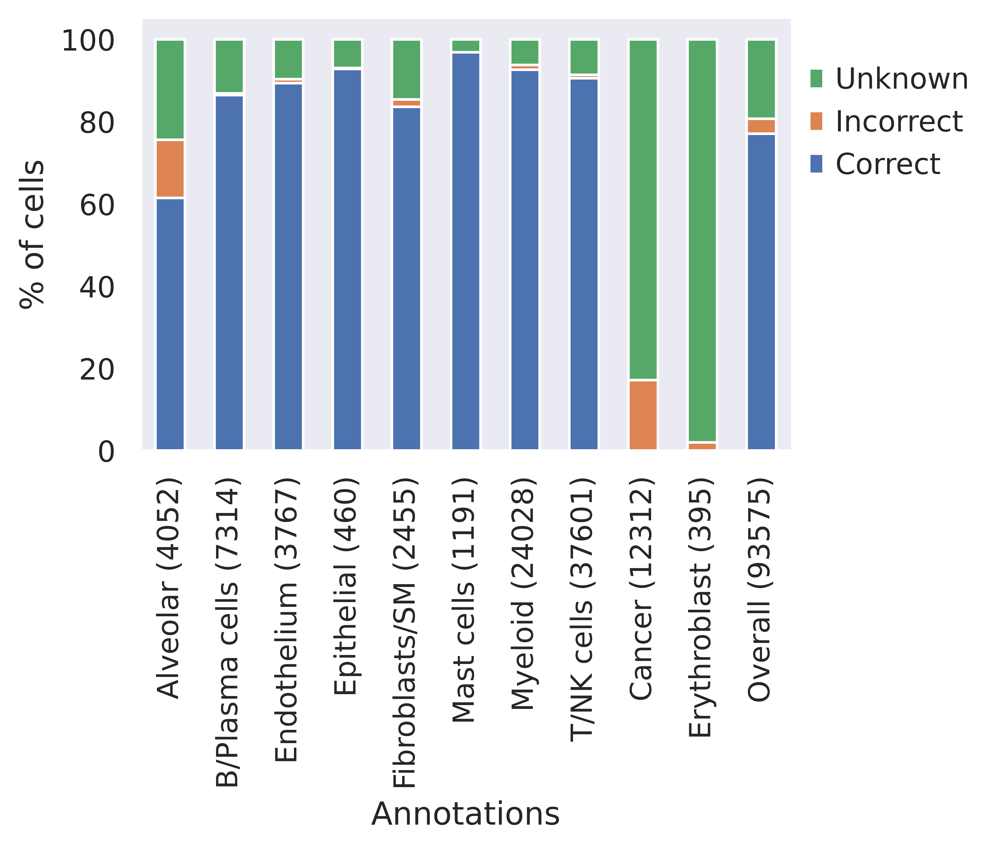

Replicate  9 DS cancer


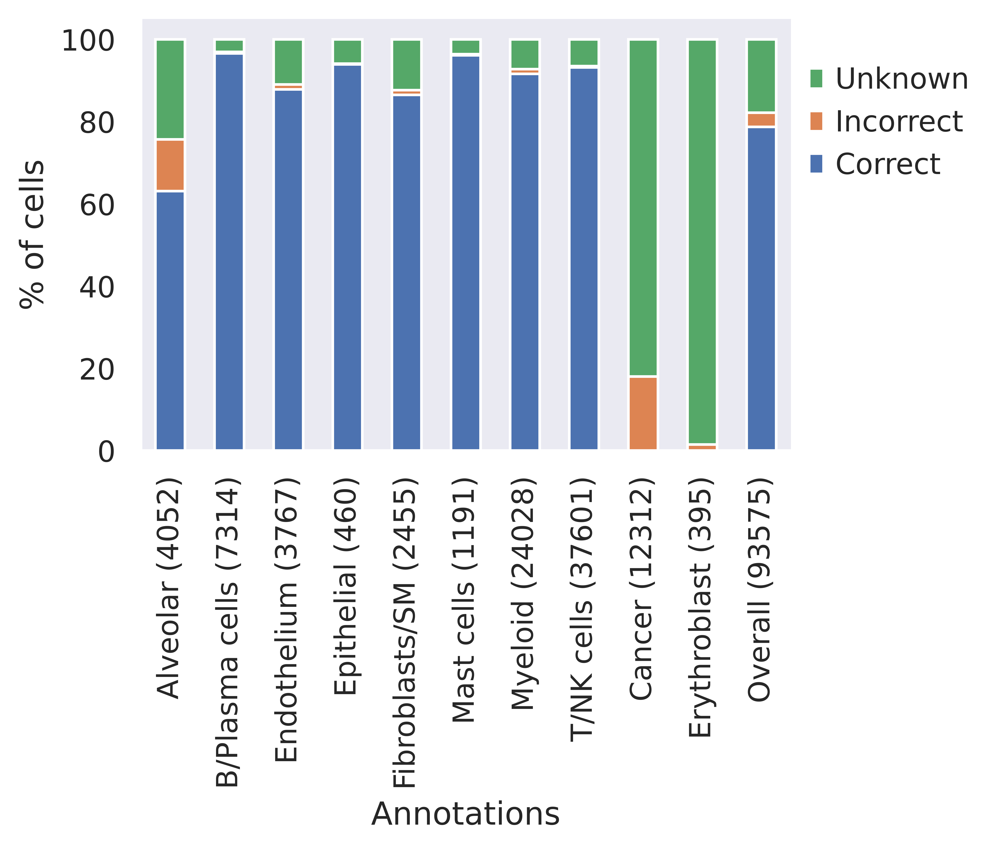

In [ ]:
UNCERTAINTY_THRESHOLD = 0.857

# cancer_result_df = None
for i in range(10):
    ds_name = 'cancer'
    method_name = f'scPoli_repl_{i}'
    print("Replicate ", i, "DS", ds_name)

    latent_output_path = MAPPED_DATA_format.format(exp=f"{ds_name}_mapped", replicate=i, ext=".latent.h5ad")
    
    if not os.path.exists(latent_output_path):
        print(f"Reference {latent_output_path} not found. Skipping.")
        continue

    adata_latent = sc.read(latent_output_path)
    adata_latent.obs['given_ann_finest_level'] = adata_cancer.obs['given_ann_finest_level']
    adata_latent.obs['acceptable_prediction'] = adata_cancer.obs['acceptable_prediction']
    adata_latent

    
    adata_latent.obs['result'] = get_prediction_performance(adata_latent.obs, 'pred_ann_class', 'pred_ann_uncert', 'acceptable_prediction', UNCERTAINTY_THRESHOLD)
    plot_hlca_cancer_results(adata_latent.obs, 'given_ann_finest_level', 'result')
    
    result_df = get_uncert_threshold_data(adata_latent.obs, 'pred_ann_class', 'pred_ann_uncert', 
                                          'acceptable_prediction', method_name=method_name, MAX_THRESHOLD=4)
    
    if cancer_result_df is None:
        cancer_result_df = result_df
    else:
        cancer_result_df = pd.concat([cancer_result_df, result_df]).reset_index(drop=True)

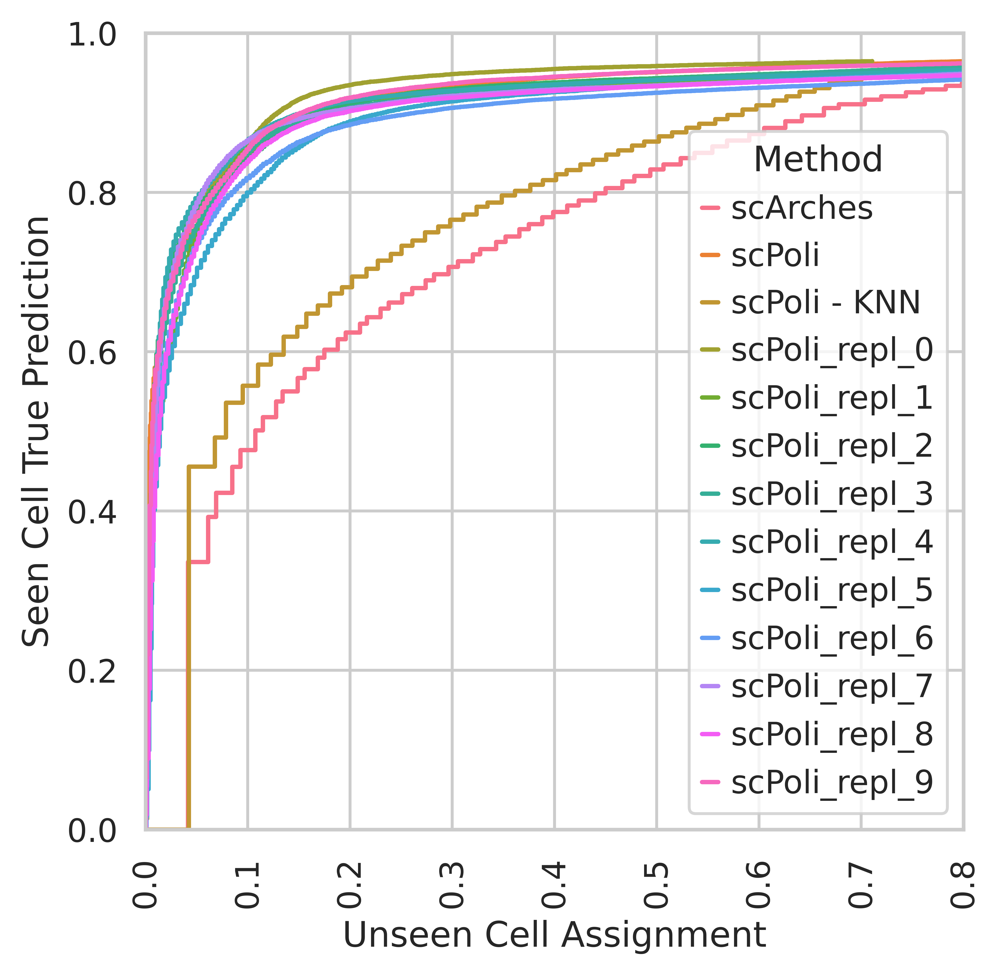

In [ ]:
plot_uncert_threshold(cancer_result_df, xlim=(0., 0.8))

In [ ]:
cancer_result_df.to_csv(THRESHOLD_CURVE_RESULT_SAVE_ADDRESS_format.format('cancer'), index=False)